# Import Libraries

In [1]:
import pandas as pd
import pickle
import matplotlib.pyplot as plt
from swarmintelligence import Utilization
from scipy.stats import wilcoxon
import cv2
from sewar.full_ref import *

# Load Experiments Results

In [2]:
# key inner join later
on=['image_name', 'thresholds']

## Single Method

In [3]:
# group each results by SI Methods
pso_masi_results = pickle.load(open('results/evaluation/PSO/PSO_masi_df.pkl', 'rb'))
ga_masi_results = pickle.load(open('results/evaluation/GA/GA_masi_df.pkl', 'rb'))
woa_masi_results = pickle.load(open('results/evaluation/WOA/WOA_masi_df.pkl', 'rb'))
gwo_masi_results = pickle.load(open('results/evaluation/GWO/GWO_masi_df.pkl', 'rb'))
sma_masi_results = pickle.load(open('results/evaluation/SMA/SMA_masi_df.pkl', 'rb'))
mem_gwo_masi_results = pickle.load(open('results/evaluation/memGWO/memGWO_masi_df.pkl', 'rb'))

In [4]:
mem_gwo_masi_results.head()

,image_name,thresholds,fitness_function,obj,Mean best_thresholds,Mean CPU_time (seconds),Mean Fitness,Mean MSE,Mean RMSE,Mean PSNR,Mean SSIM,Mean UQI,Regions,CPU_time (seconds),Fitness,MSE,RMSE,PSNR,SSIM,UQI
0,AirplaneF16.tiff,2,mMasi_entropy,max,"[113, 173]",1.137710,1948.717872,2269.814377,47.642558,14.570904,0.794437,0.940232,"[[113, 255, 255, 255, 255, 255, 255, 255, 255,...","[0.8949089050292969, 0.9719548225402832, 1.126...","[1948.7183902321062, 1948.7183902321062, 1948....","[2270.6405181884766, 2270.6405181884766, 2270....","[47.651238369936166, 47.651238369936166, 47.65...","[14.569319775617668, 14.569319775617668, 14.56...","[0.7944112258870609, 0.7944112258870609, 0.794...","[0.9402201034707982, 0.9402201034707982, 0.940..."
1,AirplaneF16.tiff,3,mMasi_entropy,max,"[93, 145, 191]",1.086729,2024.827436,1769.594390,42.066282,15.652176,0.778377,0.953308,"[[93, 255, 255, 191, 191, 191, 255, 191, 255, ...","[1.2290565967559814, 1.157872200012207, 1.1967...","[2024.8375098105803, 2024.8375098105803, 2024....","[1774.3395538330078, 1774.3395538330078, 1774....","[42.12291008267363, 42.12291008267363, 42.1229...","[15.640436268576428, 15.640436268576428, 15.64...","[0.77934507049225, 0.77934507049225, 0.7793450...","[0.9532349424759257, 0.9532349424759257, 0.953..."
2,AirplaneF16.tiff,4,mMasi_entropy,max,"[84, 129, 172, 203]",0.955852,2070.053352,1092.587863,33.053929,17.746445,0.732604,0.969380,"[[84, 203, 203, 203, 203, 203, 203, 203, 203, ...","[0.830437421798706, 1.0873453617095947, 0.8872...","[2070.0794736113085, 2069.8648340198806, 2070....","[1094.045597076416, 1093.1258392333984, 1094.0...","[33.07636009412789, 33.06245361786385, 33.0763...","[17.74044938188586, 17.744102006209904, 17.740...","[0.7326687134455045, 0.7314337006877252, 0.732...","[0.9693723689797689, 0.9696124663565749, 0.969..."
3,AirplaneF16.tiff,5,mMasi_entropy,max,"[70, 108, 143, 180, 205]",0.840863,2095.879393,906.575271,30.108332,18.557375,0.745369,0.975414,"[[70, 205, 205, 205, 180, 205, 205, 205, 205, ...","[0.8176400661468506, 1.007716178894043, 0.7717...","[2096.0455757494956, 2096.1432770275533, 2095....","[909.3038101196289, 907.2876815795898, 901.879...","[30.154664815242583, 30.121216469120064, 30.03...","[18.54371350017661, 18.55335346450818, 18.5793...","[0.7450461077231622, 0.7452811482856196, 0.745...","[0.9753498161289982, 0.9753724479476479, 0.975..."
4,Lena.png,2,mMasi_entropy,max,"[93, 151]",0.769805,1961.822013,2813.567070,53.043068,13.638231,0.612182,0.883309,"[[255, 255, 255, 255, 255, 255, 255, 255, 255,...","[0.7672407627105713, 0.8597414493560791, 0.811...","[1961.8220125153634, 1961.8220125153634, 1961....","[2813.567070007324, 2813.567070007324, 2813.56...","[53.04306806744237, 53.04306806744237, 53.0430...","[13.638230885124642, 13.638230885124642, 13.63...","[0.6121817460412936, 0.6121817460412936, 0.612...","[0.8833090574580458, 0.8833090574580458, 0.883..."


### Grouping by Metrics Evaluation

In [5]:
### ========== PSNR
ga_psnr = ga_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
pso_psnr = pso_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
woa_psnr = woa_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
gwo_psnr = gwo_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
sma_psnr = sma_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()
mem_gwo_psnr = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean PSNR', 'PSNR']].copy()


ga_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GA', 'PSNR': 'PSNR GA'}, inplace=True)
pso_psnr.rename(columns={'Mean PSNR': 'Mean PSNR PSO','PSNR': 'PSNR PSO'}, inplace=True)
woa_psnr.rename(columns={'Mean PSNR': 'Mean PSNR WOA','PSNR': 'PSNR WOA'}, inplace=True)
gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR GWO','PSNR': 'PSNR GWO'}, inplace=True)
sma_psnr.rename(columns={'Mean PSNR': 'Mean PSNR SMA', 'PSNR': 'PSNR SMA'}, inplace=True)
mem_gwo_psnr.rename(columns={'Mean PSNR': 'Mean PSNR MemoryGWO','PSNR': 'PSNR MemoryGWO'}, inplace=True)


### ======== RMSE
ga_rmse = ga_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
pso_rmse = pso_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
woa_rmse = woa_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
gwo_rmse = gwo_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
sma_rmse = sma_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()
mem_gwo_rmse = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean RMSE', 'RMSE']].copy()


ga_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GA', 'RMSE': 'RMSE GA'}, inplace=True)
pso_rmse.rename(columns={'Mean RMSE': 'Mean RMSE PSO','RMSE': 'RMSE PSO'}, inplace=True)
woa_rmse.rename(columns={'Mean RMSE': 'Mean RMSE WOA','RMSE': 'RMSE WOA'}, inplace=True)
gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE GWO','RMSE': 'RMSE GWO'}, inplace=True)
sma_rmse.rename(columns={'Mean RMSE': 'Mean RMSE SMA', 'RMSE': 'RMSE SMA'}, inplace=True)
mem_gwo_rmse.rename(columns={'Mean RMSE': 'Mean RMSE MemoryGWO','RMSE': 'RMSE MemoryGWO'}, inplace=True)


### ======== SSIM
ga_ssim = ga_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
pso_ssim = pso_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
woa_ssim = woa_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
gwo_ssim = gwo_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
sma_ssim = sma_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()
mem_gwo_ssim = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean SSIM', 'SSIM']].copy()


ga_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GA', 'SSIM': 'SSIM GA'}, inplace=True)
pso_ssim.rename(columns={'Mean SSIM': 'Mean SSIM PSO','SSIM': 'SSIM PSO'}, inplace=True)
woa_ssim.rename(columns={'Mean SSIM': 'Mean SSIM WOA','SSIM': 'SSIM WOA'}, inplace=True)
gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM GWO','SSIM': 'SSIM GWO'}, inplace=True)
sma_ssim.rename(columns={'Mean SSIM': 'Mean SSIM SMA', 'SSIM': 'SSIM SMA'}, inplace=True)
mem_gwo_ssim.rename(columns={'Mean SSIM': 'Mean SSIM MemoryGWO','SSIM': 'SSIM MemoryGWO'}, inplace=True)


### ======== UQI
ga_uqi = ga_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
pso_uqi = pso_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
woa_uqi = woa_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
gwo_uqi = gwo_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
sma_uqi = sma_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()
mem_gwo_uqi = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean UQI', 'UQI']].copy()


ga_uqi.rename(columns={'Mean UQI': 'Mean UQI GA', 'UQI': 'UQI GA'}, inplace=True)
pso_uqi.rename(columns={'Mean UQI': 'Mean UQI PSO','UQI': 'UQI PSO'}, inplace=True)
woa_uqi.rename(columns={'Mean UQI': 'Mean UQI WOA','UQI': 'UQI WOA'}, inplace=True)
gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI GWO','UQI': 'UQI GWO'}, inplace=True)
sma_uqi.rename(columns={'Mean UQI': 'Mean UQI SMA', 'UQI': 'UQI SMA'}, inplace=True)
mem_gwo_uqi.rename(columns={'Mean UQI': 'Mean UQI MemoryGWO','UQI': 'UQI MemoryGWO'}, inplace=True)



### ======== Fitness Value
ga_fitness = ga_masi_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
pso_fitness = pso_masi_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
woa_fitness = woa_masi_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
gwo_fitness = gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
sma_fitness = sma_masi_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()
mem_gwo_fitness= mem_gwo_masi_results[['image_name', 'thresholds', 'Mean Fitness', 'Fitness']].copy()


ga_fitness.rename(columns={'Mean Fitness': 'Mean Fitness GA', 'Fitness': 'Fitness GA'}, inplace=True)
pso_fitness.rename(columns={'Mean Fitness': 'Mean Fitness PSO','Fitness': 'Fitness PSO'}, inplace=True)
woa_fitness.rename(columns={'Mean Fitness': 'Mean Fitness WOA','Fitness': 'Fitness WOA'}, inplace=True)
gwo_fitness.rename(columns={'Mean Fitness': 'Mean Fitness GWO','Fitness': 'Fitness GWO'}, inplace=True)
sma_fitness.rename(columns={'Mean Fitness': 'Mean Fitness SMA', 'Fitness': 'Fitness SMA'}, inplace=True)
mem_gwo_fitness.rename(columns={'Mean Fitness': 'Mean Fitness MemoryGWO','Fitness': 'Fitness MemoryGWO'}, inplace=True)


### ======== CPU Time
ga_cpu_time = ga_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
pso_cpu_time = pso_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
woa_cpu_time = woa_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
gwo_cpu_time = gwo_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
sma_cpu_time = sma_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()
mem_gwo_cpu_time = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean CPU_time (seconds)', 'CPU_time (seconds)']].copy()


ga_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GA', 'CPU_time (seconds)': 'CPU_time (seconds) GA'}, inplace=True)
pso_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) PSO','CPU_time (seconds)': 'CPU_time (seconds) PSO'}, inplace=True)
woa_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) WOA','CPU_time (seconds)': 'CPU_time (seconds) WOA'}, inplace=True)
gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) GWO','CPU_time (seconds)': 'CPU_time (seconds) GWO'}, inplace=True)
sma_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) SMA', 'CPU_time (seconds)': 'CPU_time (seconds) SMA'}, inplace=True)
mem_gwo_cpu_time.rename(columns={'Mean CPU_time (seconds)': 'Mean CPU_time (seconds) MemoryGWO','CPU_time (seconds)': 'CPU_time (seconds) MemoryGWO'}, inplace=True)


### ========== Best Threshold
ga_threshold = ga_masi_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
pso_threshold = pso_masi_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
woa_threshold = woa_masi_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
gwo_threshold = gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
sma_threshold = sma_masi_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()
mem_gwo_threshold = mem_gwo_masi_results[['image_name', 'thresholds', 'Mean best_thresholds']].copy()


ga_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds GA'}, inplace=True)
pso_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds PSO'}, inplace=True)
woa_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds WOA'}, inplace=True)
gwo_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds GWO'}, inplace=True)
sma_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds SMA'}, inplace=True)
mem_gwo_threshold.rename(columns={'Mean best_thresholds': 'Mean Thresholds MemoryGWO'}, inplace=True)

### Merge Results

In [6]:
### ======== PSNR
psnr_merge = ga_psnr.merge(pso_psnr, on=on).merge(woa_psnr, on=on).merge(gwo_psnr, on=on).merge(sma_psnr, on=on).merge(mem_gwo_psnr, on=on)
psnr_merge = psnr_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== RMSE
rmse_merge = ga_rmse.merge(pso_rmse, on=on).merge(woa_rmse, on=on).merge(gwo_rmse, on=on).merge(sma_rmse, on=on).merge(mem_gwo_rmse, on=on)
rmse_merge = rmse_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== SSIM
ssim_merge = ga_ssim.merge(pso_ssim, on=on).merge(woa_ssim, on=on).merge(gwo_ssim, on=on).merge(sma_ssim, on=on).merge(mem_gwo_ssim, on=on)
ssim_merge = ssim_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== UQI
uqi_merge = ga_uqi.merge(pso_uqi, on=on).merge(woa_uqi, on=on).merge(gwo_uqi, on=on).merge(sma_uqi, on=on).merge(mem_gwo_uqi, on=on)
uqi_merge = uqi_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== Fitness Value
fitness_merge = ga_fitness.merge(pso_fitness, on=on).merge(woa_fitness, on=on).merge(gwo_fitness, on=on).merge(sma_fitness, on=on).merge(mem_gwo_fitness, on=on)
fitness_merge = fitness_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### ======== CPU Time
cpu_time_merge = ga_cpu_time.merge(pso_cpu_time, on=on).merge(woa_cpu_time, on=on).merge(gwo_cpu_time, on=on).merge(sma_cpu_time, on=on).merge(mem_gwo_cpu_time, on=on)
cpu_time_merge = cpu_time_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])


### ======== Best Threshold
threshold_merge = ga_threshold.merge(pso_threshold, on=on).merge(woa_threshold, on=on).merge(gwo_threshold, on=on).merge(sma_threshold, on=on).merge(mem_gwo_threshold, on=on)
threshold_merge = threshold_merge.groupby('image_name', group_keys=True).apply(lambda x: x).drop(columns=['image_name'])

### Find Best value in each metrics

In [7]:
algorithms = ['PSO', 'GA', 'WOA', 'GWO', 'SMA', 'MemoryGWO']

def findMaximumMetrics(list_of_values):
    return max(list_of_values)

def calculateStandardDeviation(list_of_values):
    return np.std(list_of_values)

In [8]:
for idx_algo, algo in enumerate(algorithms):
    # find the best value from 30 running each methods
    psnr_merge[f'Best PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(findMaximumMetrics)     
    rmse_merge[f'Best RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(findMaximumMetrics)     
    ssim_merge[f'Best SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(findMaximumMetrics)     
    uqi_merge[f'Best UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(findMaximumMetrics)     
    cpu_time_merge[f'Best CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(findMaximumMetrics)
    fitness_merge[f'Best Fitness {algo}'] = fitness_merge[f'Fitness {algo}'].apply(findMaximumMetrics)
    
    # calculate standard deviation
    psnr_merge[f'Std PSNR {algo}'] = psnr_merge[f'PSNR {algo}'].apply(calculateStandardDeviation)     
    rmse_merge[f'Std RMSE {algo}'] = rmse_merge[f'RMSE {algo}'].apply(calculateStandardDeviation)     
    ssim_merge[f'Std SSIM {algo}'] = ssim_merge[f'SSIM {algo}'].apply(calculateStandardDeviation)     
    uqi_merge[f'Std UQI {algo}'] = uqi_merge[f'UQI {algo}'].apply(calculateStandardDeviation)     
    cpu_time_merge[f'Std CPU_time (seconds) {algo}'] = cpu_time_merge[f'CPU_time (seconds) {algo}'].apply(calculateStandardDeviation)
    fitness_merge[f'Std Fitness {algo}'] = fitness_merge[f'Fitness {algo}'].apply(calculateStandardDeviation)

# Quantitative Image Analysis

## Mean PSNR

In [9]:
psnr_merge

thresholds  Mean PSNR GA   
image_name                                           
AirplaneF16.tiff      0            2     14.531163  \
                      1            3     15.647126   
                      2            4     16.524698   
                      3            5     17.306491   
Lena.png              4            2     13.998826   
                      5            3     16.480858   
                      6            4     17.838923   
                      7            5     19.086250   
Male.tiff             8            2     10.910311   
                      9            3     14.062968   
                      10           4     15.841635   
                      11           5     17.298003   
Mandrill.tiff         12           2     13.118274   
                      13           3     14.771476   
                      14           4     16.617334   
                      15           5     17.078519   
Peppers.tiff          16           2     11.974289   
                      17           3     14.318369   
                      18           4     16.015593   
                      19           5     17.159746   
Sailboat on lake.tiff 20           2     13.458042   
                      21           3     16.160331   
                      22           4     17.302747   
                      23           5     18.996096   

                                                                    PSNR GA   
image_name                                                                    
AirplaneF16.tiff      0   [14.484663552965714, 14.236093935027718, 14.37...  \
                      1   [15.0745504866957, 15.448143376491094, 15.3475...   
                      2   [15.376331850360366, 17.0582160408734, 15.2392...   
                      3   [15.534309413649092, 16.044793353004827, 16.20...   
Lena.png              4   [14.388408084383268, 15.224069763701022, 14.75...   
                      5   [16.30681088168337, 17.139162422252618, 14.618...   
                      6   [17.622475537653013, 17.142061954903767, 18.15...   
                      7   [20.254292480159787, 19.856191308680728, 17.10...   
Male.tiff             8   [12.198510197309936, 11.926124572472363, 11.48...   
                      9   [13.677201260387232, 15.512614656886118, 11.54...   
                      10  [17.301276031522924, 15.528670190015879, 16.41...   
                      11  [18.419074057756898, 19.08231834039054, 16.273...   
Mandrill.tiff         12  [10.962619466842284, 12.602156412515983, 13.76...   
                      13  [14.574590747631715, 12.991565344280877, 13.92...   
                      14  [16.548155308291342, 15.738753049199039, 16.53...   
                      15  [17.759791375483907, 17.707373611148814, 17.50...   
Peppers.tiff          16  [11.85420481788308, 12.037887887566168, 13.020...   
                      17  [12.013164096655824, 11.76521971636519, 15.305...   
                      18  [16.153052459682982, 15.722551033098963, 15.36...   
                      19  [18.73419380529095, 13.937110554464343, 18.481...   
Sailboat on lake.tiff 20  [13.55919435515008, 13.783599510685661, 13.272...   
                      21  [16.873893862405097, 17.975470510367995, 16.25...   
                      22  [19.020808933005323, 17.144159419501268, 18.11...   
                      23  [15.337981621909611, 19.477823874966116, 19.69...   

                          Mean PSNR PSO   
image_name                                
AirplaneF16.tiff      0       14.575375  \
                      1       15.660840   
                      2       17.849375   
                      3       18.876725   
Lena.png              4       13.669290   
                      5       17.158816   
                      6       19.080061   
                      7       20.453735   
Male.tiff             8       11.559996   
                      9       14.210655   
                      10      17.740279   
       

In [10]:
# save results
metrics='PSNR'
psnr_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_masi.xlsx')
psnr_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_psnr_masi.xlsx')
psnr_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_psnr_masi.xlsx')
psnr_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_psnr_masi.xlsx')

## Mean RMSE

In [11]:
rmse_merge

thresholds  Mean RMSE GA   
image_name                                           
AirplaneF16.tiff      0            2     47.903832  \
                      1            3     42.314498   
                      2            4     38.494026   
                      3            5     35.409009   
Lena.png              4            2     51.451930   
                      5            3     38.495664   
                      6            4     32.901965   
                      7            5     28.456648   
Male.tiff             8            2     73.329796   
                      9            3     51.294864   
                      10           4     41.881193   
                      11           5     35.512849   
Mandrill.tiff         12           2     56.654655   
                      13           3     47.282533   
                      14           4     38.273952   
                      15           5     36.692650   
Peppers.tiff          16           2     64.438831   
                      17           3     49.769676   
                      18           4     40.887848   
                      19           5     35.904927   
Sailboat on lake.tiff 20           2     54.221964   
                      21           3     40.031411   
                      22           4     35.179764   
                      23           5     29.011072   

                                                                    RMSE GA   
image_name                                                                    
AirplaneF16.tiff      0   [48.11793739711863, 49.51485181778402, 48.7521...  \
                      1   [44.95858728279936, 43.06584883071799, 43.5675...   
                      2   [43.42337627636489, 35.7790972332747, 44.11395...   
                      3   [42.640737721429424, 40.206892872572894, 39.45...   
Lena.png              4   [48.654137283154725, 44.19129131190579, 46.648...   
                      5   [39.01212762901216, 35.4472100950375, 47.38262...   
                      6   [33.52867595821867, 35.43537904558448, 31.5379...   
                      7   [24.76427148435582, 25.925707386044394, 35.577...   
Male.tiff             8   [62.60581457050047, 64.6002132760652, 67.94708...   
                      9   [52.80561651029797, 42.747374660344555, 67.490...   
                      10  [34.79175840049726, 42.668430766253465, 38.538...   
                      11  [30.5904930960652, 28.34159341533661, 39.16319...   
Mandrill.tiff         12  [72.17872514773752, 59.76299581890527, 52.2766...   
                      13  [47.62233031792615, 57.14285213061719, 51.3198...   
                      14  [37.943065455040504, 41.64880336585748, 37.985...   
                      15  [33.0027866342929, 33.2025546251561, 33.973604...   
Peppers.tiff          16  [65.1373280225909, 63.774312577978456, 56.9524...   
                      17  [63.956100398380485, 65.8080761356391, 43.7800...   
                      18  [39.70887264967559, 41.726564465558255, 43.482...   
                      19  [29.500575625735777, 51.248912334530694, 30.37...   
Sailboat on lake.tiff 20  [53.52793169398148, 52.16271705829097, 55.3215...   
                      21  [36.54647439424785, 32.19338585824079, 39.2504...   
                      22  [28.543007641404667, 35.42682315978016, 31.696...   
                      23  [43.61552448713464, 27.080020369348794, 26.409...   

                          Mean RMSE PSO   
image_name                                
AirplaneF16.tiff      0       47.618066  \
                      1       42.027665   
                      2       32.689841   
                      3       29.066342   
Lena.png              4       52.856108   
                      5       35.372314   
                      6       28.359355   
                      7       24.227660   
Male.tiff             8       67.381454   
                      9       49.660733   
                      10      33.113139   
       

In [12]:
# save results
metrics='RMSE'
rmse_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_masi.xlsx')
rmse_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_rmse_masi.xlsx')
rmse_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_rmse_masi.xlsx')
rmse_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_rmse_masi.xlsx')

## Mean SSIM

In [13]:
ssim_merge

thresholds  Mean SSIM GA   
image_name                                           
AirplaneF16.tiff      0            2      0.774509  \
                      1            3      0.767552   
                      2            4      0.766569   
                      3            5      0.766616   
Lena.png              4            2      0.614256   
                      5            3      0.682544   
                      6            4      0.714120   
                      7            5      0.746820   
Male.tiff             8            2      0.424786   
                      9            3      0.512847   
                      10           4      0.563149   
                      11           5      0.612564   
Mandrill.tiff         12           2      0.636327   
                      13           3      0.689964   
                      14           4      0.739730   
                      15           5      0.761971   
Peppers.tiff          16           2      0.558987   
                      17           3      0.611179   
                      18           4      0.652697   
                      19           5      0.682186   
Sailboat on lake.tiff 20           2      0.660769   
                      21           3      0.698396   
                      22           4      0.728475   
                      23           5      0.757329   

                                                                    SSIM GA   
image_name                                                                    
AirplaneF16.tiff      0   [0.7911818785663393, 0.7792262557912678, 0.785...  \
                      1   [0.7887831901278607, 0.7593064139025851, 0.793...   
                      2   [0.7817258553550651, 0.7212173470876521, 0.811...   
                      3   [0.8203447017476955, 0.7760329918440272, 0.776...   
Lena.png              4   [0.6190248903185123, 0.6307561679906727, 0.615...   
                      5   [0.6536973309287344, 0.6809744120901272, 0.652...   
                      6   [0.7207143509156608, 0.7177975268242448, 0.697...   
                      7   [0.7843502873554894, 0.7755907546913032, 0.721...   
Male.tiff             8   [0.4465190605104181, 0.4290350491103384, 0.435...   
                      9   [0.5290974424715303, 0.5213467648144777, 0.501...   
                      10  [0.5685628713985991, 0.5570091508917605, 0.583...   
                      11  [0.6406732678917185, 0.6351320674514185, 0.600...   
Mandrill.tiff         12  [0.5404565529467196, 0.6239861007719447, 0.663...   
                      13  [0.6945089028793636, 0.6209683725735327, 0.670...   
                      14  [0.7188856832415271, 0.742974443287659, 0.7556...   
                      15  [0.7800212241285425, 0.7674038154095054, 0.782...   
Peppers.tiff          16  [0.5659893455488191, 0.5540875886229254, 0.550...   
                      17  [0.5547845138286392, 0.5698980842276182, 0.620...   
                      18  [0.6423091394267364, 0.6547554660315119, 0.656...   
                      19  [0.7031861969047777, 0.6498174745904794, 0.707...   
Sailboat on lake.tiff 20  [0.6909066527960498, 0.6913110872732552, 0.669...   
                      21  [0.7175987576736385, 0.7366664252368879, 0.698...   
                      22  [0.7586963621515458, 0.693981007984923, 0.7243...   
                      23  [0.7351900397083191, 0.7718133838039448, 0.786...   

                          Mean SSIM PSO   
image_name                                
AirplaneF16.tiff      0        0.794478  \
                      1        0.777508   
                      2        0.733145   
                      3        0.746641   
Lena.png              4        0.612937   
                      5        0.705961   
                      6        0.752149   
                      7        0.778978   
Male.tiff             8        0.439454   
                      9        0.535144   
                      10       0.613117   
       

In [14]:
metrics='SSIM'
# save results
ssim_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_masi.xlsx')
ssim_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_ssim_masi.xlsx')
ssim_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_ssim_masi.xlsx')
ssim_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_ssim_masi.xlsx')

## Mean UQI

In [15]:
metrics='UQI'
# save results
uqi_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_masi.xlsx')
uqi_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_uqi_masi.xlsx')
uqi_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_uqi_masi.xlsx')
uqi_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_uqi_masi.xlsx')

## Mean CPU Time (Seconds)

In [16]:
metrics='CPU_time (seconds)'
# save results
cpu_time_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_masi.xlsx')
cpu_time_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_cpu_time_masi.xlsx')
cpu_time_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_cpu_time_masi.xlsx')
cpu_time_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_cpu_time_masi.xlsx')

## Mean Fitness

In [17]:
metrics='Fitness'
# save results
fitness_merge[[f'{metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi.xlsx')
fitness_merge[[f'Mean {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/mean_fitness_masi.xlsx')
fitness_merge[[f'Best {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/best_fitness_masi.xlsx')
fitness_merge[[f'Std {metrics} {algo}' for algo in algorithms]].to_excel('results/evaluation/Merge/'+metrics+'/std_fitness_masi.xlsx')

## Mean Thresholds

In [18]:
threshold_merge

thresholds        Mean Thresholds GA   
image_name                                                       
AirplaneF16.tiff      0            2                [118, 175]  \
                      1            3            [94, 144, 187]   
                      2            4       [75, 118, 161, 194]   
                      3            5  [70, 106, 142, 166, 198]   
Lena.png              4            2                [100, 158]   
                      5            3            [80, 128, 176]   
                      6            4       [73, 109, 142, 180]   
                      7            5  [68, 102, 129, 157, 188]   
Male.tiff             8            2                 [56, 118]   
                      9            3             [47, 92, 147]   
                      10           4        [38, 83, 124, 176]   
                      11           5   [29, 70, 103, 139, 179]   
Mandrill.tiff         12           2                 [99, 149]   
                      13           3            [82, 124, 160]   
                      14           4       [66, 107, 142, 174]   
                      15           5   [59, 94, 122, 146, 176]   
Peppers.tiff          16           2                 [72, 136]   
                      17           3            [61, 113, 160]   
                      18           4        [52, 92, 131, 171]   
                      19           5   [42, 76, 112, 145, 179]   
Sailboat on lake.tiff 20           2                 [92, 152]   
                      21           3            [81, 137, 188]   
                      22           4       [71, 114, 152, 194]   
                      23           5   [46, 83, 127, 165, 201]   

                               Mean Thresholds PSO       Mean Thresholds WOA   
image_name                                                                     
AirplaneF16.tiff      0                 [113, 173]                [113, 173]  \
                      1             [93, 145, 191]            [92, 143, 190]   
                      2        [85, 132, 174, 204]       [80, 125, 169, 202]   
                      3   [76, 114, 149, 184, 206]  [65, 106, 141, 178, 205]   
Lena.png              4                  [93, 151]                 [93, 151]   
                      5             [81, 127, 171]            [80, 126, 170]   
                      6        [77, 115, 147, 182]       [72, 111, 144, 179]   
                      7   [72, 106, 133, 159, 189]   [63, 94, 124, 151, 183]   
Male.tiff             8                  [57, 124]                 [53, 121]   
                      9              [39, 92, 142]             [36, 89, 140]   
                      10        [35, 81, 123, 162]        [23, 68, 113, 156]   
                      11    [23, 58, 94, 130, 169]    [11, 42, 82, 123, 164]   
Mandrill.tiff         12                 [98, 150]                 [97, 150]   
                      13            [81, 122, 159]            [51, 113, 156]   
                      14       [65, 100, 134, 166]        [37, 95, 130, 164]   
                      15   [53, 89, 116, 143, 171]   [12, 58, 103, 135, 166]   
Peppers.tiff          16                 [68, 135]                 [66, 135]   
                      17            [63, 119, 166]            [56, 113, 163]   
                      18        [43, 84, 125, 169]        [30, 77, 123, 168]   
                      19   [32, 70, 105, 139, 174]    [26, 55, 97, 137, 173]   
Sailboat on lake.tiff 20                 [86, 155]                 [85, 154]   
                      21            [79, 141, 195]            [75, 138, 193]   
                      22       [68, 111, 159, 199]       [63, 106, 156, 198]   
                      23   [59, 90, 129, 168, 201]   [46, 81, 122, 164, 200]   

                               Mean Thresholds GWO       Mean Thresholds SMA   
image_name                                                                     
AirplaneF16.tiff      0                 [113, 173]                [1

In [19]:
threshold_merge.to_excel('results/evaluation/Merge/mean_thresholds_masi.xlsx')

# Qualitative Image Analysis

In [20]:
# load test image benchmark in grayscale format
test_dataset_misc = pickle.load(open('datasets/test_dataset.pkl', 'rb'))
gray_misc_dataset = test_dataset_misc['gray']
gray_misc_dataset

{'AirplaneF16.tiff': array([[ 65, 199, 193, ..., 166, 164, 148],
        [ 54, 196, 192, ..., 179, 155, 140],
        [ 54, 197, 194, ..., 190, 159, 141],
        ...,
        [ 67, 213, 213, ..., 184, 176, 151],
        [ 68, 214, 214, ..., 166, 184, 167],
        [ 89,  86,  88, ..., 112, 111, 107]], dtype=uint8),
 'Lena.png': array([[162, 162, 162, ..., 170, 155, 128],
        [162, 162, 162, ..., 170, 155, 128],
        [162, 162, 162, ..., 170, 155, 128],
        ...,
        [ 43,  43,  50, ..., 104, 100,  98],
        [ 44,  44,  55, ..., 104, 105, 108],
        [ 44,  44,  55, ..., 104, 105, 108]], dtype=uint8),
 'Male.tiff': array([[130, 138, 140, ..., 115, 113, 111],
        [139, 134, 131, ..., 110, 117, 116],
        [141, 127, 131, ..., 109, 108, 107],
        ...,
        [102, 103, 103, ...,  76,  80,  89],
        [106, 102, 109, ...,  72,  69,  82],
        [ 98, 105, 116, ...,  85,  81,  89]], dtype=uint8),
 'Mandrill.tiff': array([[145,  56,  49, ..., 113, 153, 177],

## 2-Level

In [21]:
mLevel = 2
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,0,2,"[118, 175]","[113, 173]","[113, 173]","[113, 173]","[116, 174]","[113, 173]"
Lena.png,4,2,"[100, 158]","[93, 151]","[93, 151]","[93, 151]","[93, 157]","[93, 151]"
Male.tiff,8,2,"[56, 118]","[57, 124]","[53, 121]","[57, 124]","[61, 141]","[57, 124]"
Mandrill.tiff,12,2,"[99, 149]","[98, 150]","[97, 150]","[98, 150]","[98, 154]","[98, 150]"
Peppers.tiff,16,2,"[72, 136]","[68, 135]","[66, 135]","[68, 135]","[74, 145]","[68, 135]"
Sailboat on lake.tiff,20,2,"[92, 152]","[86, 155]","[85, 154]","[86, 155]","[93, 156]","[86, 155]"


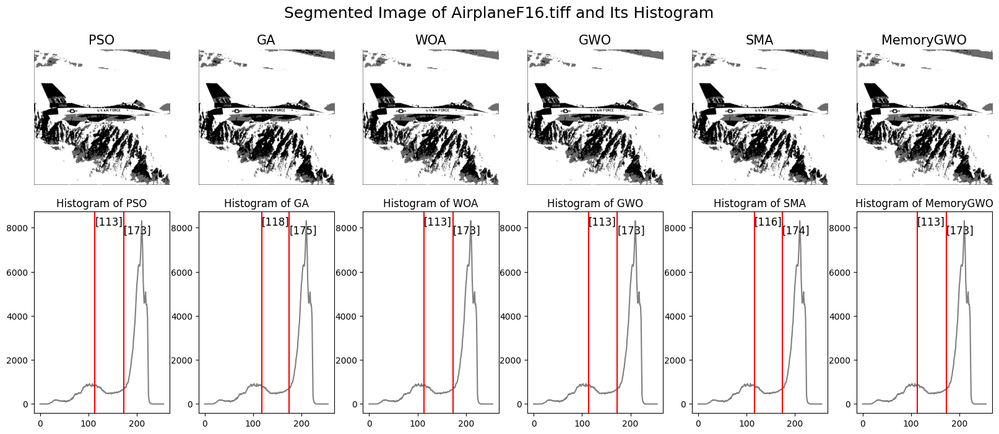

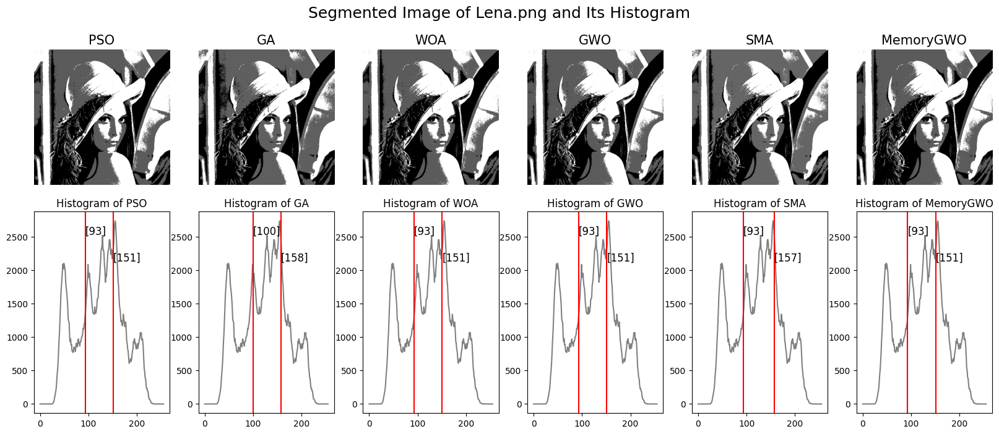

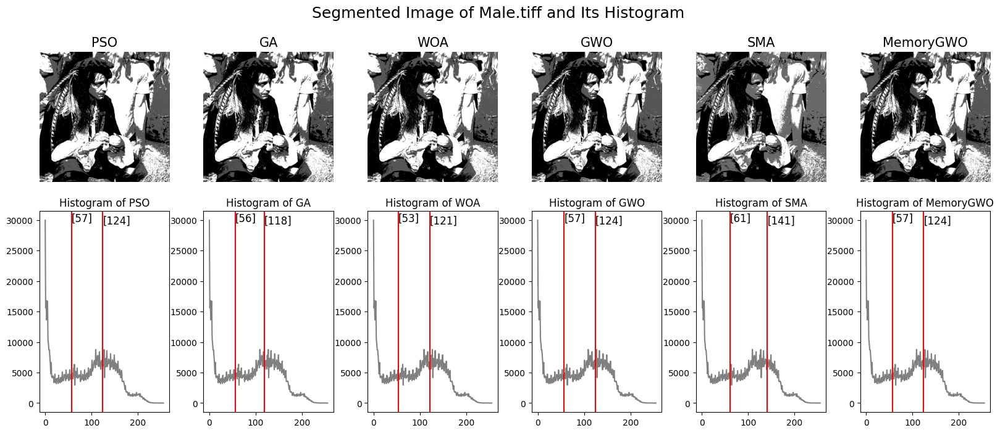

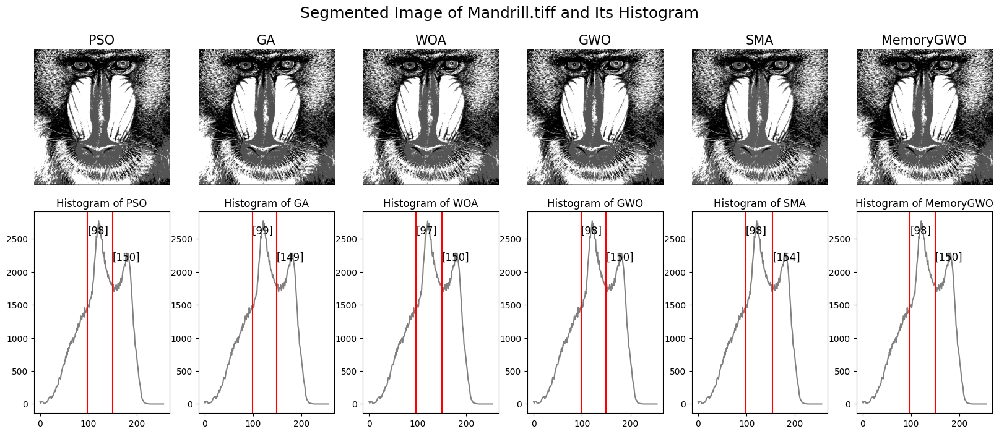

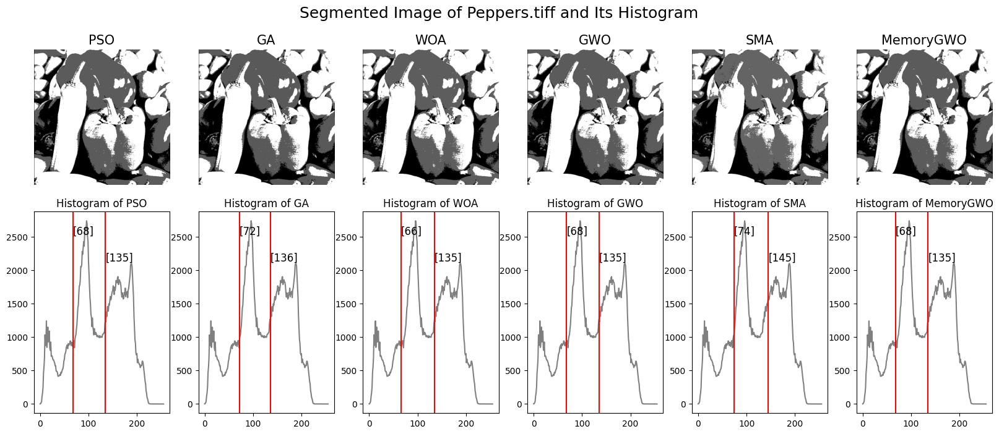

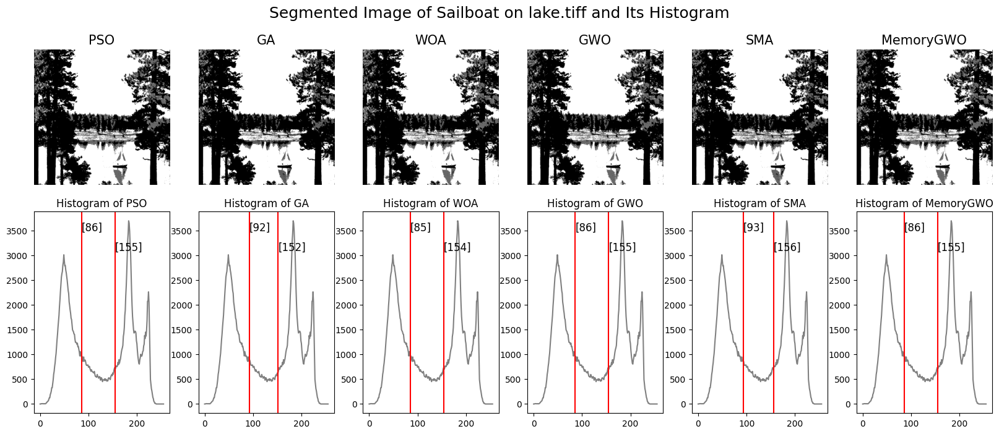

In [22]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 3-Level

In [23]:
mLevel = 3
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,1,3,"[94, 144, 187]","[93, 145, 191]","[92, 143, 190]","[93, 145, 191]","[82, 139, 185]","[93, 145, 191]"
Lena.png,5,3,"[80, 128, 176]","[81, 127, 171]","[80, 126, 170]","[81, 127, 171]","[77, 131, 179]","[81, 127, 171]"
Male.tiff,9,3,"[47, 92, 147]","[39, 92, 142]","[36, 89, 140]","[39, 92, 142]","[33, 86, 150]","[39, 92, 142]"
Mandrill.tiff,13,3,"[82, 124, 160]","[81, 122, 159]","[51, 113, 156]","[86, 125, 161]","[50, 114, 165]","[86, 125, 161]"
Peppers.tiff,17,3,"[61, 113, 160]","[63, 119, 166]","[56, 113, 163]","[61, 117, 165]","[41, 96, 161]","[63, 119, 166]"
Sailboat on lake.tiff,21,3,"[81, 137, 188]","[79, 141, 195]","[75, 138, 193]","[79, 141, 195]","[76, 138, 187]","[79, 141, 195]"


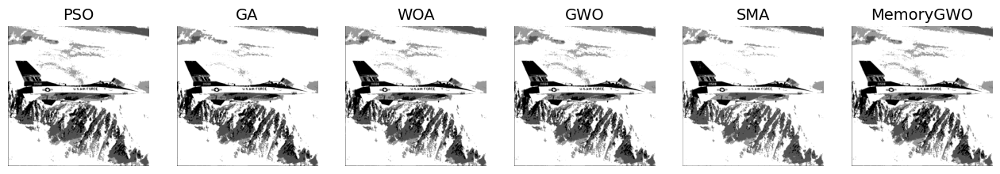

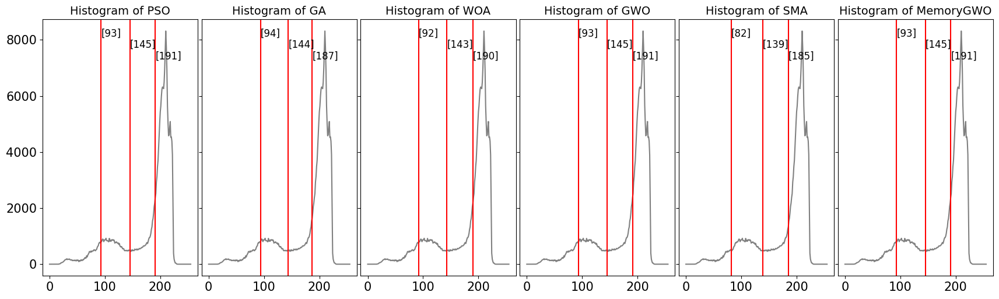

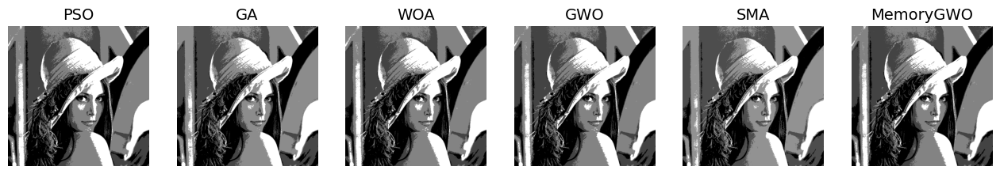

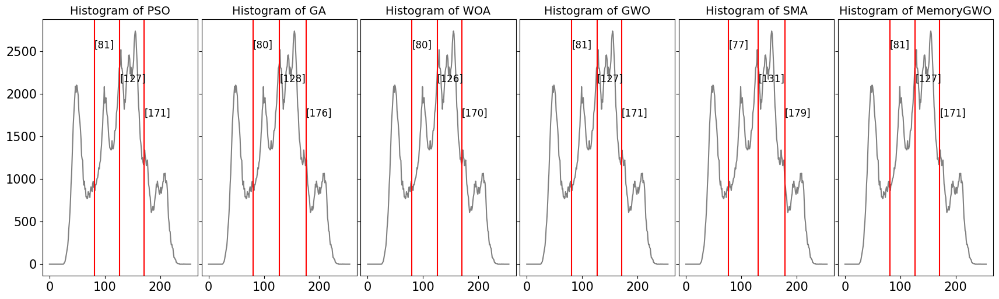

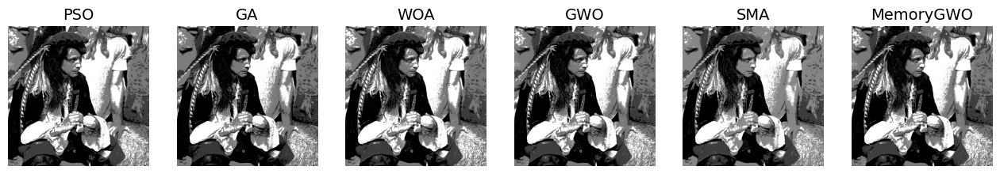

...

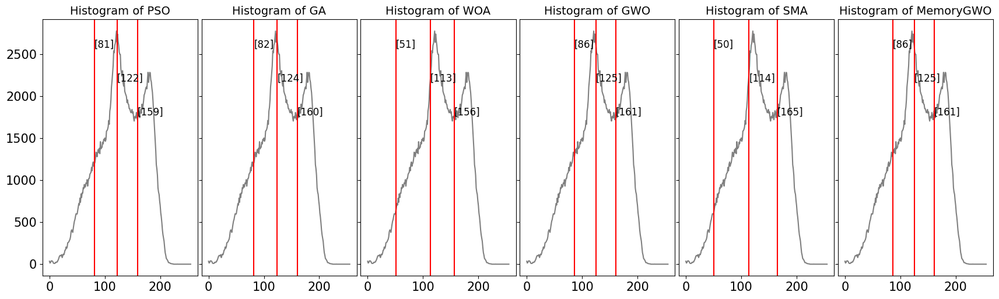

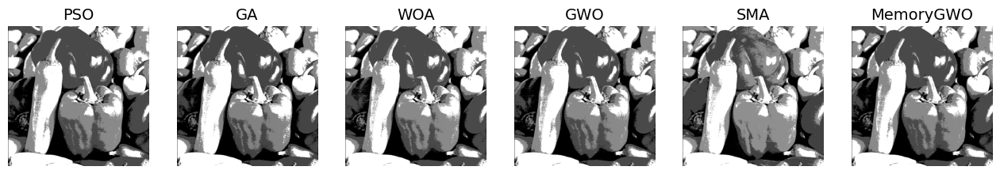

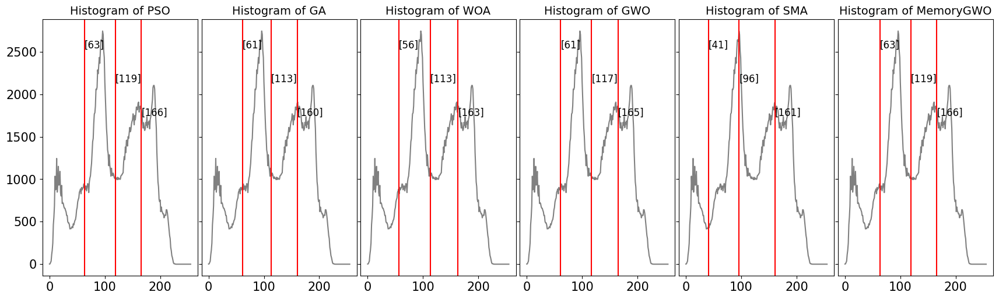

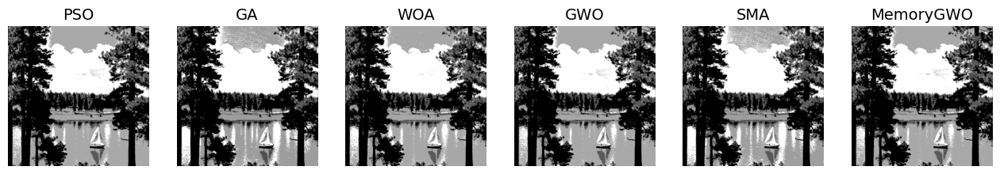

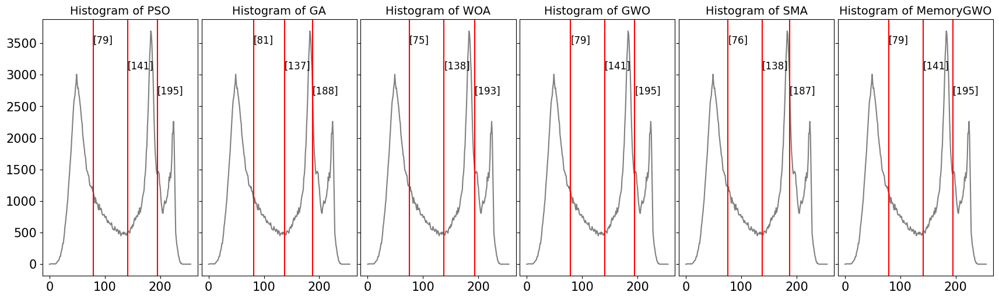

In [24]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, ax_row1 = plt.subplots(nrows=1, ncols=len(algorithms), figsize=(16, 7))
#     fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    fig, ax_row2 = plt.subplots(
        nrows=1, ncols=len(algorithms), 
        figsize=(17,5), 
        sharey=True
    )
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=14)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo), fontsize=14)
        ax_row2[idx].tick_params(axis='x', labelsize=15)
        ax_row2[idx].tick_params(axis='y', labelsize=15)
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 4-Level

In [25]:
mLevel = 4
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,2,4,"[75, 118, 161, 194]","[85, 132, 174, 204]","[80, 125, 169, 202]","[84, 129, 172, 203]","[57, 108, 153, 191]","[84, 129, 172, 203]"
Lena.png,6,4,"[73, 109, 142, 180]","[77, 115, 147, 182]","[72, 111, 144, 179]","[75, 114, 145, 180]","[45, 96, 140, 187]","[75, 114, 145, 180]"
Male.tiff,10,4,"[38, 83, 124, 176]","[35, 81, 123, 162]","[23, 68, 113, 156]","[35, 82, 124, 164]","[15, 58, 110, 171]","[35, 82, 124, 164]"
Mandrill.tiff,14,4,"[66, 107, 142, 174]","[65, 100, 134, 166]","[37, 95, 130, 164]","[70, 106, 137, 168]","[40, 90, 132, 174]","[70, 105, 137, 168]"
Peppers.tiff,18,4,"[52, 92, 131, 171]","[43, 84, 125, 169]","[30, 77, 123, 168]","[47, 86, 126, 169]","[32, 86, 130, 173]","[47, 87, 126, 169]"
Sailboat on lake.tiff,22,4,"[71, 114, 152, 194]","[68, 111, 159, 199]","[63, 106, 156, 198]","[67, 110, 158, 199]","[32, 91, 144, 189]","[67, 110, 158, 199]"


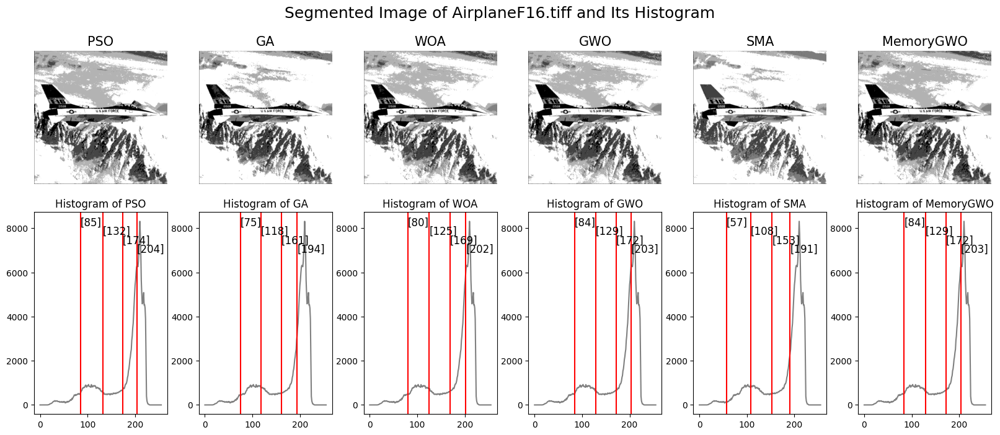

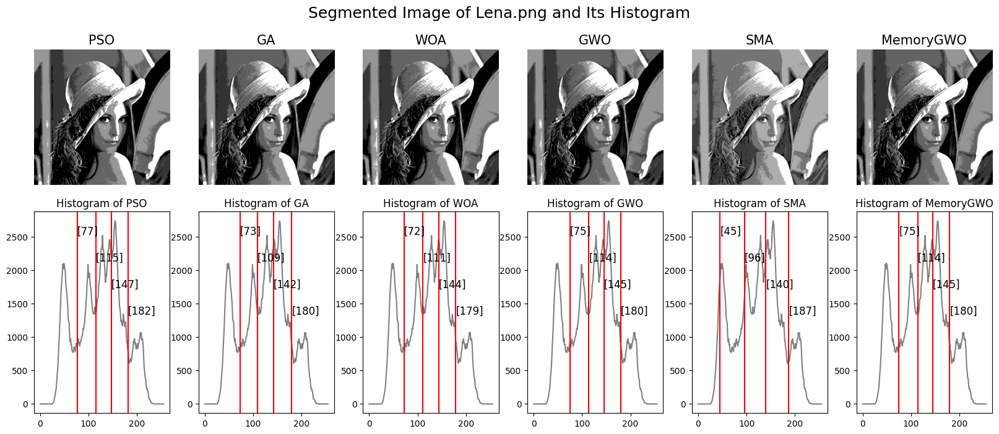

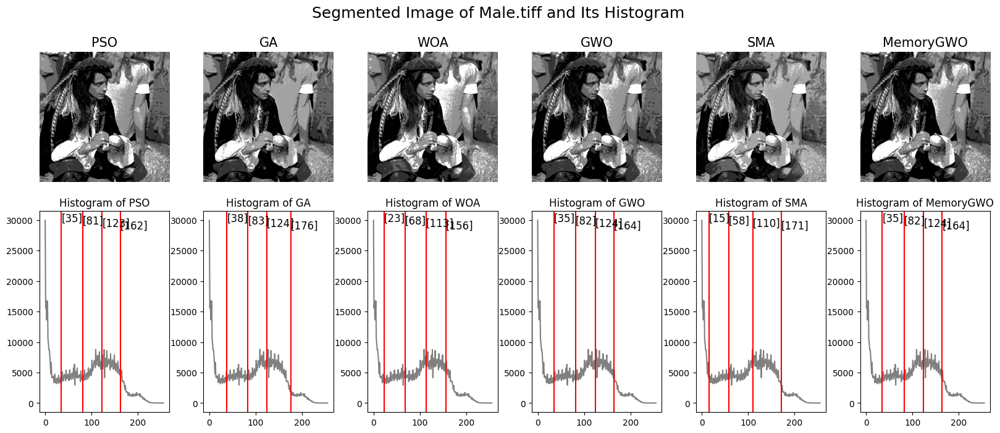

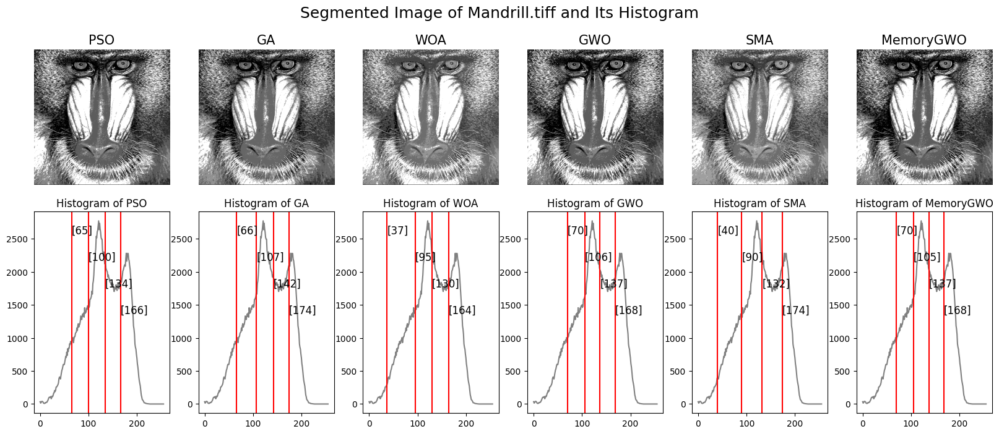

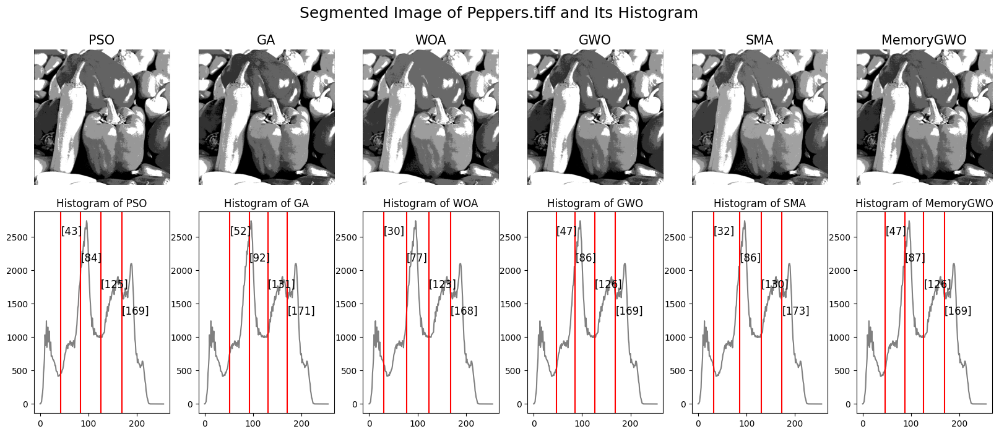

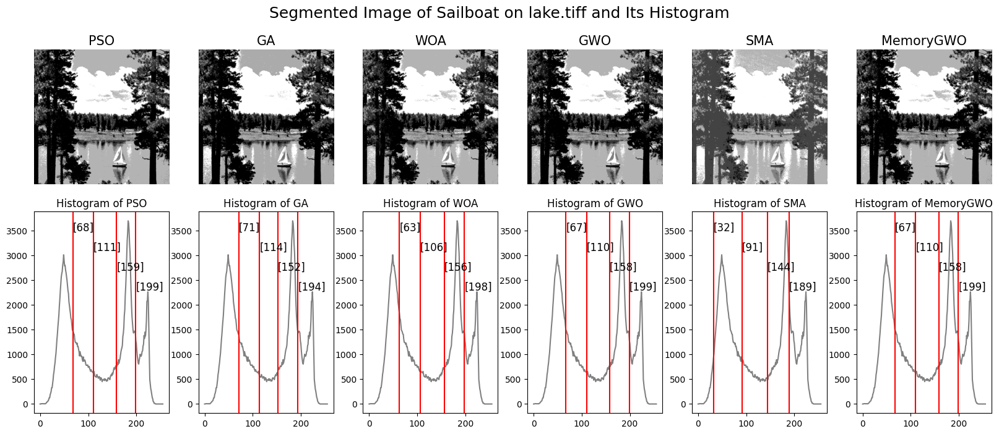

In [26]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=400
    fig.suptitle('Segmented Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)

## 5-Level

In [27]:
mLevel = 5
filtered_results = threshold_merge[
    threshold_merge['thresholds']==mLevel
]
filtered_results

,,thresholds,Mean Thresholds GA,Mean Thresholds PSO,Mean Thresholds WOA,Mean Thresholds GWO,Mean Thresholds SMA,Mean Thresholds MemoryGWO
image_name,,,,,,,,
AirplaneF16.tiff,3,5,"[70, 106, 142, 166, 198]","[76, 114, 149, 184, 206]","[65, 106, 141, 178, 205]","[69, 107, 143, 180, 205]","[43, 103, 144, 175, 202]","[70, 108, 143, 180, 205]"
Lena.png,7,5,"[68, 102, 129, 157, 188]","[72, 106, 133, 159, 189]","[63, 94, 124, 151, 183]","[71, 105, 132, 157, 186]","[43, 81, 118, 150, 186]","[72, 107, 134, 158, 187]"
Male.tiff,11,5,"[29, 70, 103, 139, 179]","[23, 58, 94, 130, 169]","[11, 42, 82, 123, 164]","[27, 65, 100, 134, 172]","[15, 54, 95, 146, 189]","[28, 65, 100, 134, 172]"
Mandrill.tiff,15,5,"[59, 94, 122, 146, 176]","[53, 89, 116, 143, 171]","[12, 58, 103, 135, 166]","[65, 98, 124, 149, 175]","[37, 82, 119, 151, 181]","[67, 99, 125, 149, 175]"
Peppers.tiff,19,5,"[42, 76, 112, 145, 179]","[32, 70, 105, 139, 174]","[26, 55, 97, 137, 173]","[41, 78, 112, 146, 177]","[17, 59, 106, 147, 185]","[42, 79, 113, 146, 177]"
Sailboat on lake.tiff,23,5,"[46, 83, 127, 165, 201]","[59, 90, 129, 168, 201]","[46, 81, 122, 164, 200]","[58, 89, 128, 167, 201]","[22, 81, 123, 161, 207]","[58, 88, 128, 167, 201]"


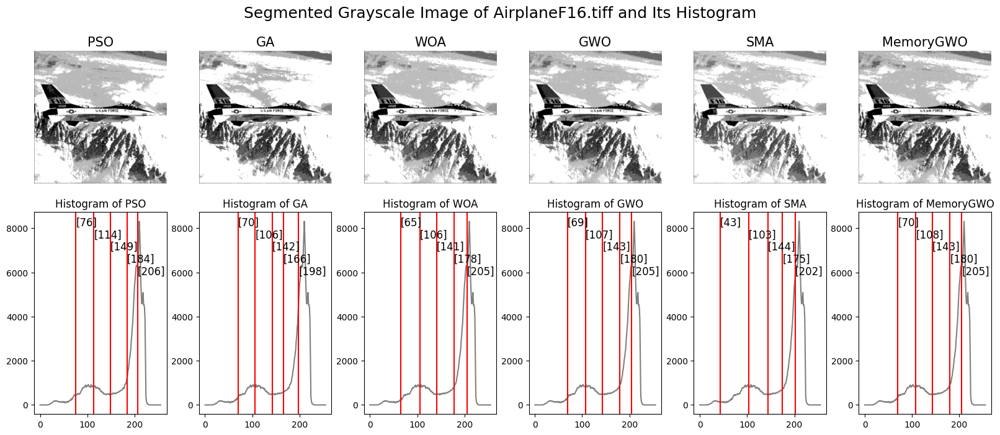

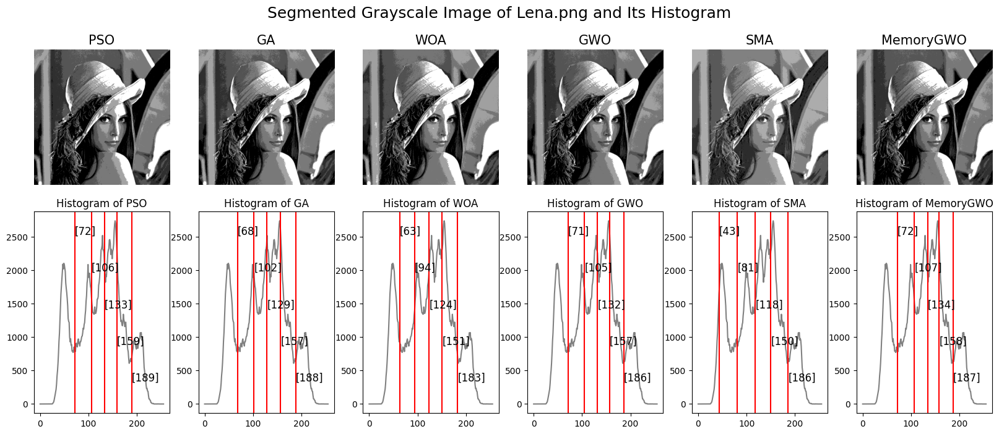

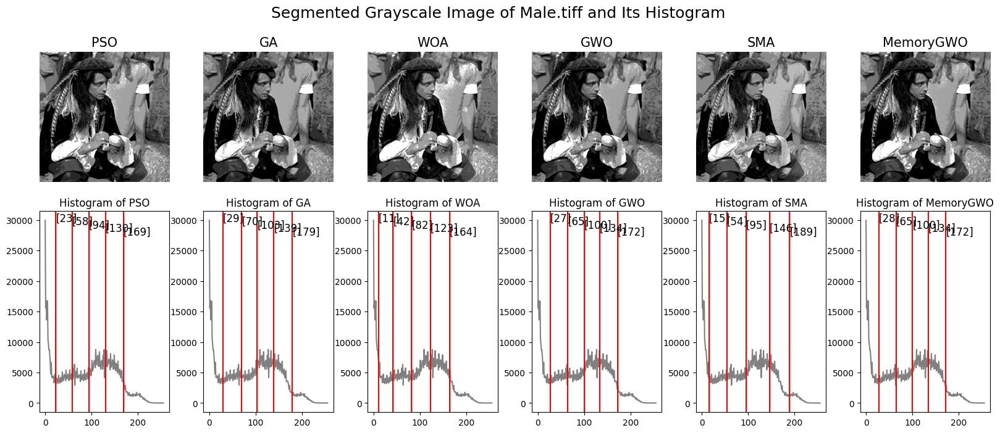

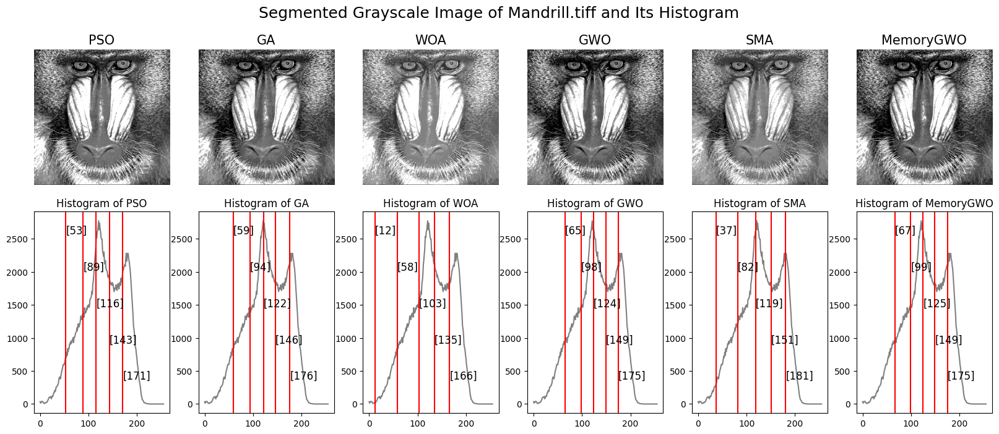

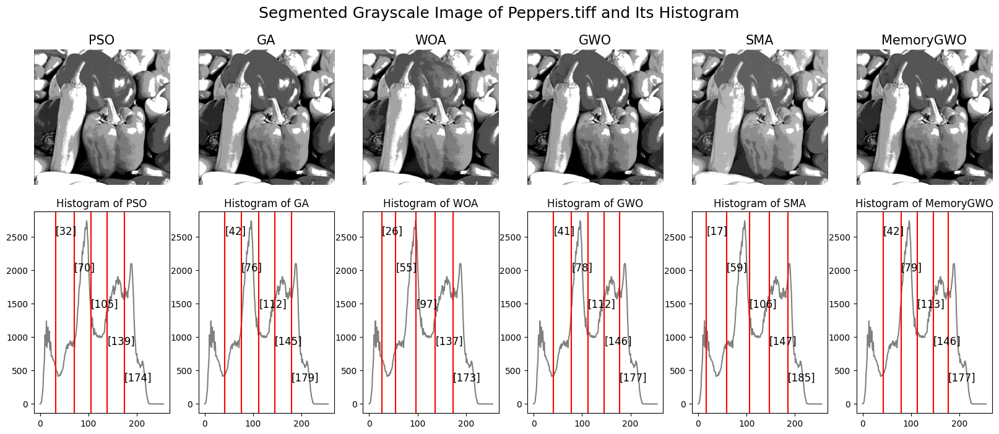

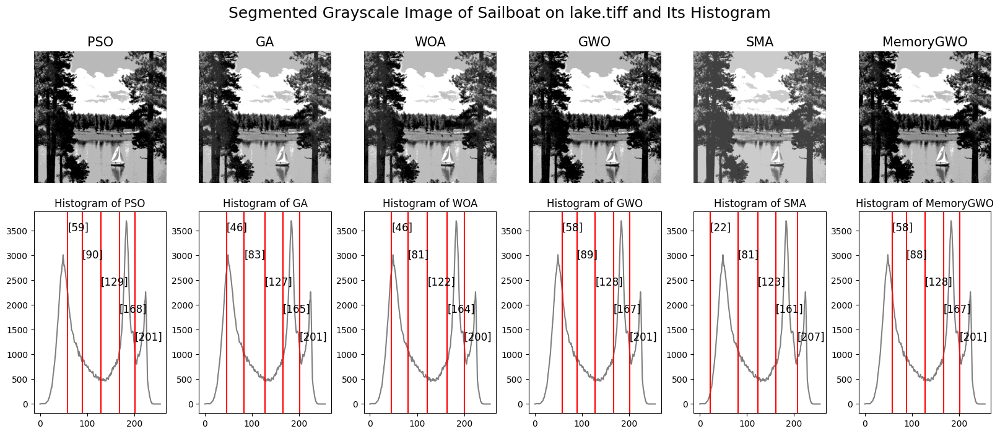

In [28]:
# loop untuk setiap citra uji tampilkan segmented image dan histogram thresholdnya
for idx, a in filtered_results.iterrows():
    # get the image name
    image_name = a.name[0]
    image_pixels = gray_misc_dataset[image_name]
    
    # loop through algorithms method and get its mean threshold
    fig, (ax_row1, ax_row2) = plt.subplots(nrows=2, ncols=len(algorithms), figsize=(16, 7))
    for idx, algo in enumerate(algorithms):
        best_threshold = a.loc['Mean Thresholds {}'.format(algo)]
        # plot the segmented results in first row
        regions = Utilization().digitize(image_pixels, best_threshold)
        ax_row1[idx].imshow(regions, cmap='gist_gray')
        ax_row1[idx].set_title('{}'.format(algo), fontsize=15)
        ax_row1[idx].axis('off')
        
        # plot the histogram threshold in second row
        gray_hist = cv2.calcHist([image_pixels], [0], None, [256], (0, 256))
        y_max = gray_hist[
            np.argmax(gray_hist)
        ]
        ax_row2[idx].plot(gray_hist, c='gray', label='Gray')
        ax_row2[idx].set_title('Histogram of {}'.format(algo))
        counter=0
        for thresh in best_threshold:
            ax_row2[idx].axvline(thresh, color='r')
            ax_row2[idx].text(thresh, y_max-200-counter, '[{}]'.format(thresh),fontsize=12)
            counter+=550
    fig.suptitle('Segmented Grayscale Image of {} and Its Histogram'.format(image_name), fontsize=18)
    plt.tight_layout(pad=0.25, w_pad=0.12, h_pad=0.12)